# INTRO TO ARTIFICIAL NEURAL NETWORKS - WARM UP USING CPNNS
Recommended reading David Ha's articles on the subject [[1]](http://blog.otoro.net/2016/03/25/generating-abstract-patterns-with-tensorflow/) [[2]](http://blog.otoro.net/2015/07/31/neurogram/) [[3]](http://blog.otoro.net/2015/06/19/neural-network-generative-art/)).

For this exercise we will use colab, tensorflow and Keras.

The code is based on https://blog.otoro.net/, https://github.com/hardmaru/cppn-tensorflow/blob/master/model.py and some excerpts from Renaud Danhaive (https://danhaive.com/)

**Library Imports**  

In [21]:
import numpy as np
from matplotlib import pyplot as plt
import keras
from keras import models, layers, initializers
from keras import backend as K


Having the possibility of building the modell architectrure as using the functional or the Sequential, we will go for sequential because we are just stacking Fully connected layers. 

**First, let's build a simple NN with one fully-connected hidden layer with 10 units and hyperbolic tangent activation with a single output with sigmoid activation.**  

We will consider our latent vector is 2-dimensional. This means that our input is of size (5,). 
We will initialize our network with random weights. 


In [23]:
model = models.Sequential()
init = initializers.VarianceScaling(scale=10)
model.add(layers.Dense(32, activation="tanh", input_shape=(5,),kernel_initializer=init,use_bias=False))
model.add(layers.Dense(32, activation="tanh", kernel_initializer=init,use_bias=False))
model.add(layers.Dense(32, activation="tanh", kernel_initializer=init,use_bias=False))
model.add(layers.Dense(1,activation="sigmoid", kernel_initializer=init,use_bias=False))

Let's define a function generating a grid of pixel locations in the $[0,1]\times [0,1]$ domain. We'll assume all images are square.


In [24]:
def pixelGrid(resolution=64):
  x = np.linspace(-1,1, resolution)
  X,Y = np.meshgrid(x,x)
  return np.vstack([X.flatten(),Y.flatten()]).T

#print the grid to check how the data looks like
print(pixelGrid(64).shape)
print(pixelGrid(64))

(4096, 2)
[[-1.         -1.        ]
 [-0.96825397 -1.        ]
 [-0.93650794 -1.        ]
 ...
 [ 0.93650794  1.        ]
 [ 0.96825397  1.        ]
 [ 1.          1.        ]]


Next we need to build a function that generates an image by using a model to predict B&W values (0:black, 1:white).

In [25]:
def generateIm(model,z=[0,0],resolution=64, scale=1.0):
  pixels = pixelGrid(resolution)*scale
  input = np.hstack([pixels,np.linalg.norm(pixels,axis=1).reshape(-1,1),np.repeat([z],resolution**2, axis=0)*scale])
  return model.predict(input, batch_size=128).reshape(resolution,resolution)

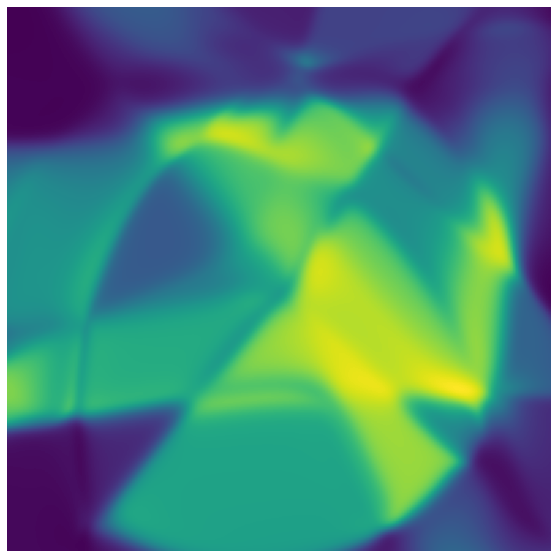

In [32]:
#@title Latent Vector { run: "auto" }
z1 = -0.455 #@param {type:"slider", min:-1, max:1, step:0.001}
z2 = -0.678 #@param {type:"slider", min:-1, max:1, step:0.001}
scale = 6.21 #@param {type:"slider", min:0, max:10, step:0.01}


im = generateIm(model,z=[z1,z2],scale=scale,resolution=200)

plt.figure(figsize=(10,10))
plt.axis('off')
plt.imshow(im)


Because we've set up our generative network to depend on the latent vector $\mathbf{z}$, we can explore the latent space by varying the vector progressively and observe how the image evolves.

Specifically, we can plot the resulting images over a 2D grid to visualize the image space.

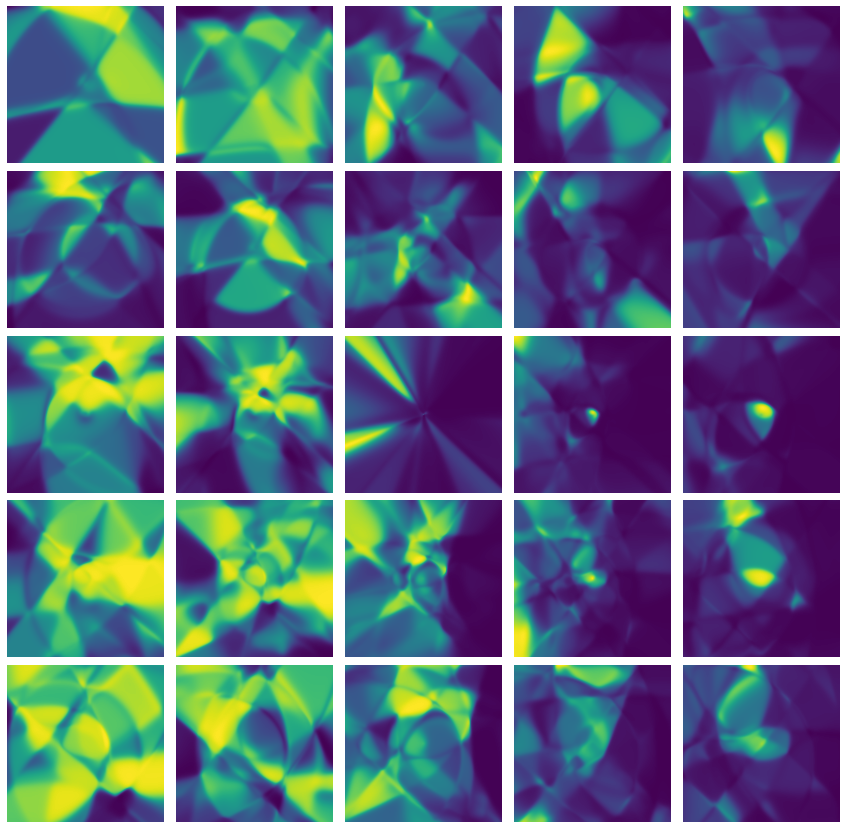

In [33]:
resolution = 600
n = 5 # number of images per rows columns
z = np.linspace(-1,1,n)
Z1,Z2 = np.meshgrid(z,z)
Z = np.vstack([Z1.flatten(),Z2.flatten()]).T

fig, axes = plt.subplots(n,n,figsize=(15,15))
fig.subplots_adjust(hspace=0.05, wspace=0.05)

count = 0
for latentvec in Z:
  im = generateIm(model,z=[latentvec[0],latentvec[1]],scale=scale,resolution=resolution)
  i,j = int(count/n), int(count%n)
  axes[i,j].imshow(im)
  axes[i,j].axis("off")
  count +=1


This example shows the power of neural networks to generate complex functions as each image can be interpreted as the function that the NN corresponds to when the latent vector is fixed to a certain value.  
If youi want to create an animation, use the cell below

In [ ]:
from matplotlib.animation import FuncAnimation
from matplotlib import animation, rc
from IPython.display import HTML

#@title Latent Vector { run: "auto" }
z1 = 1 #@param {type:"slider", min:-1, max:1, step:0.001}
scale = 5.26 #@param {type:"slider", min:0, max:10, step:0.01}

nframes = 40
Z2 = np.linspace(-1,1,nframes)


fig, ax = plt.subplots(figsize=(7,7))
plt.axis('off')
plt.close()

def update(i):
  im = generateIm(model,z=[z1,Z2[i]],scale=scale,resolution=300)
  art=ax.imshow(im)
  return (art,)  
  
  
anim = FuncAnimation(fig, update, frames=np.arange(0,nframes), interval=200, blit=True)
rc('animation', html='jshtml')
anim